# Add and Remove Noise

**What is Noise?**

![](https://2.bp.blogspot.com/-b-hwrNlSs4Y/V6IKh7NamaI/AAAAAAAAOB4/rJ7oPYVKZgg2Py9eA7pR62Lbn1yNJjnvwCLcB/s1600/ISO-Noise.jpg)

Digital Camera sensors can take pictures in low light environments by increasing the sensativity of the camera sensor (CCD). However, this increase in sensativity (ISO increase) comes with a price. The price is noise. Noise arises because the higher sensativity of the sensor makes it susceptible to random noise. This is because the in low light scenes there isn't much variation between the scene and random photon noise.<br>
So there is not enough light for such an sensativy measurement.

https://blog.michaeldanielho.com/2016/08/understanding-cameras-exposure-setting.html

---
### Imports and Helper-functions

In [1]:
import os
import random

import numpy as np
import matplotlib.pyplot as plt
import cv2

In [2]:
def imshow(img, title=None, size=10, axis=False, color_space="BGR"):
    aspect_ratio = img.shape[0] / img.shape[1]
    plt.figure(figsize=(size * aspect_ratio, size))
    if color_space.lower() == "bgr":
        rgb_img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
    elif color_space.lower() == "rgb":
        rgb_img = img
    else:
        rgb_img = cv2.cvtColor(img, cv2.COLOR_HSV2RGB)
    plt.imshow(rgb_img)
    if type(title) == str:
        plt.title(title)
    if axis == False:
        plt.axis('off')
    plt.show()

In [34]:
def get_random_img_path(search_path='../../res/img', skip=["flickr"]):
    """
    This function searches for common image files in all subdirectories
    and return a random image path of them.
    """
    image_extensions = ['.jpg', '.jpeg', '.png', '.gif', '.bmp', '.tiff', '.ico']
    image_paths = []

    # Walk through all subdirectories
    for root, dirs, files in os.walk(search_path):
        for file_name in files:
            # Check if the file is an image
            if any(file_name.lower().endswith(ext) for ext in image_extensions):
                # Get the full file path
                full_path = os.path.join(root, file_name).replace("\\", "/")
                if not any(i in full_path for i in skip):
                    image_paths.append(full_path)

    return random.choice(image_paths)

# get an image
IMG_PATH = get_random_img_path(skip=["flickr", "weather", "gem", "Cheetahs", "Lions", "chinese_art", "course_img"])
IMG_PATH   

'../../res/img/self/DSC06103.jpg'

---
### Loading data

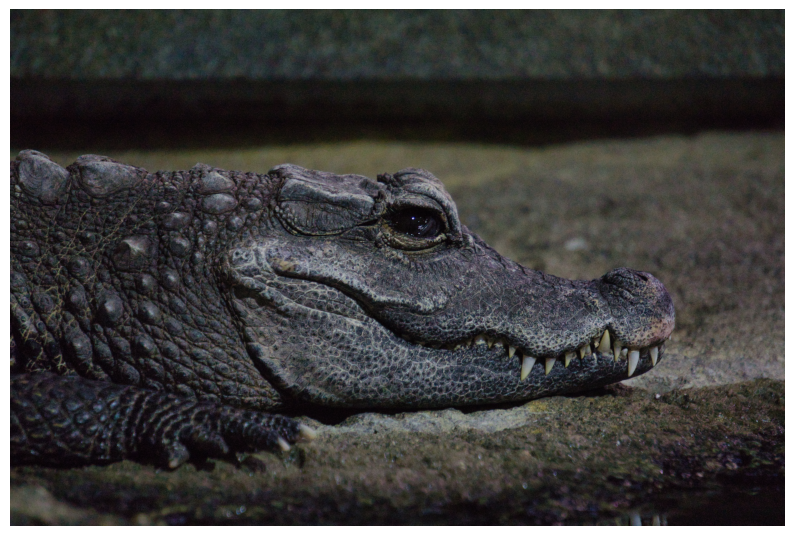

(4000, 6000, 3)

In [40]:
img = cv2.imread(IMG_PATH)
imshow(img, size=15)

gray = cv2.cvtColor(img, cv2.COLOR_BGR2GRAY)

img.shape

---
### Adding noise

In [41]:
def add_white_noise(image, prob=None):
    image = image.copy()
    if prob is None:
        # Set the range for a random probablity
        # A large prob will mean more noise
        prob = random.uniform(0.05, 0.1)

    # Generate a random matrix in the shape of our input image
    rnd = np.random.rand(image.shape[0], image.shape[1])

    # If the random values in our rnd matrix are less than our random probability
    # We randomly change that pixel in our input image to a value within the range specified
    image[rnd < prob] = np.random.randint(50,230)
    return image

In [48]:
def crop(img, start_x=0.4, start_y=0.4, end_x=0.6, end_y=0.6):
    height, width = img.shape[:2]

    start_x = int(width*start_x)
    start_y = int(height*start_y)
    end_x = int(width*end_x)
    end_y = int(height*end_y)

    return img[start_y:end_y, start_x:end_x]

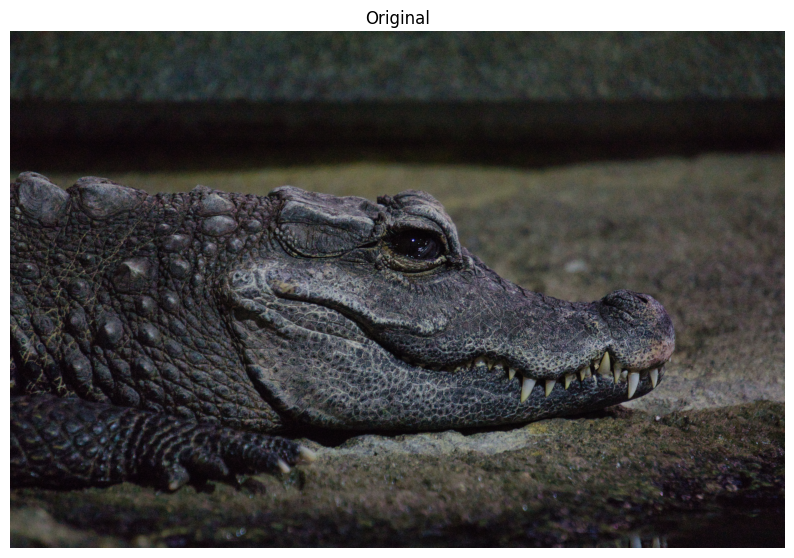

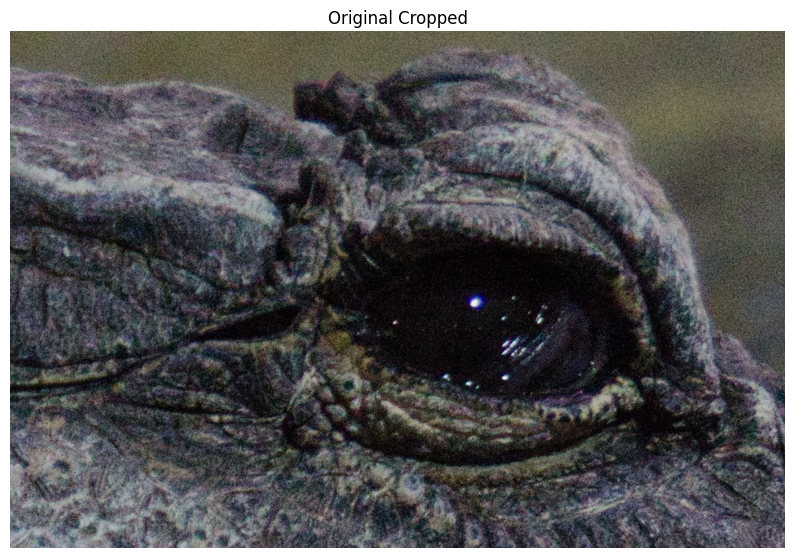

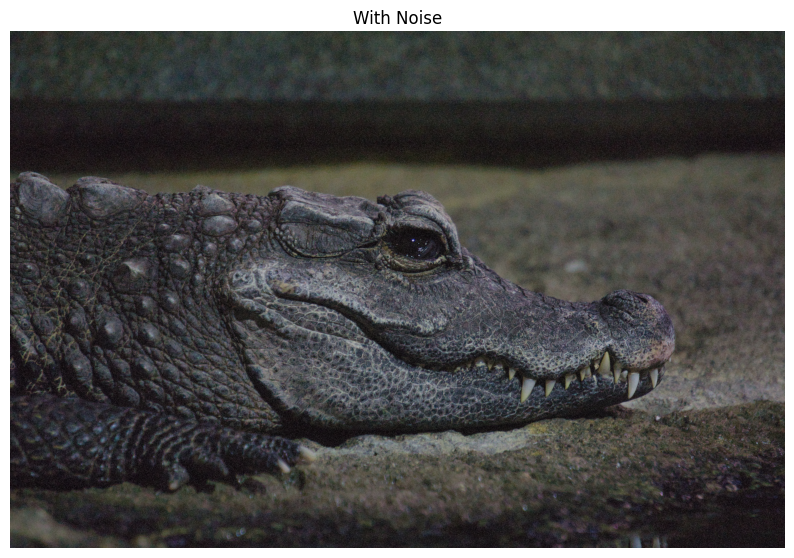

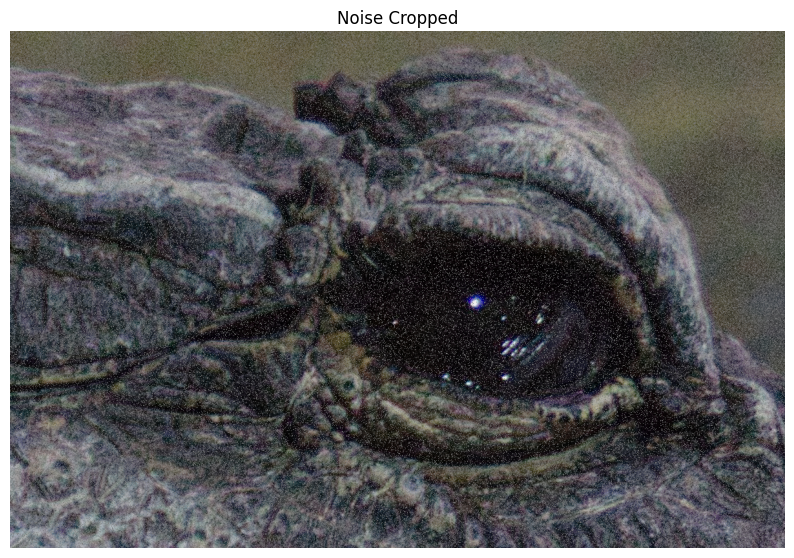

In [51]:
imshow(img, "Original", size=15)
imshow(crop(img, 0.4, 0.3, 0.6, 0.5), "Original Cropped", size=15)

noise_img = add_white_noise(img, prob=0.1)
imshow(noise_img, "With Noise", size=15)
imshow(crop(noise_img, 0.4, 0.3, 0.6, 0.5), "Noise Cropped", size=15)

---
### Denoising an Image

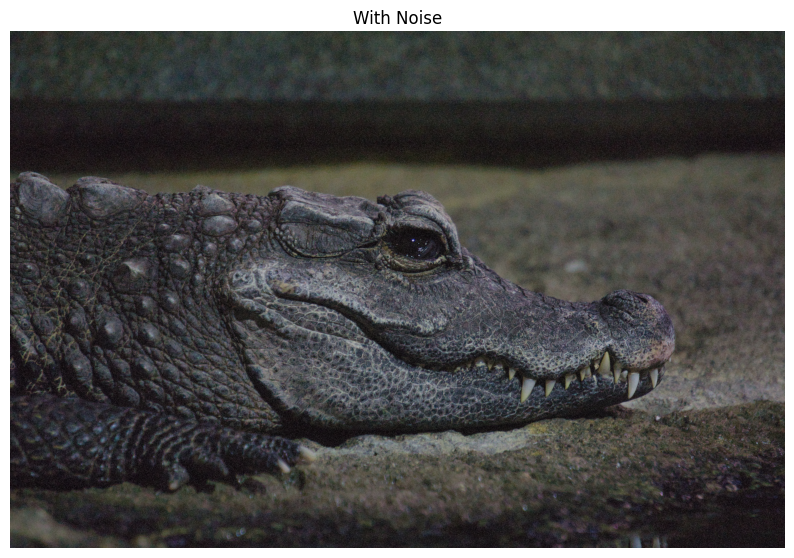

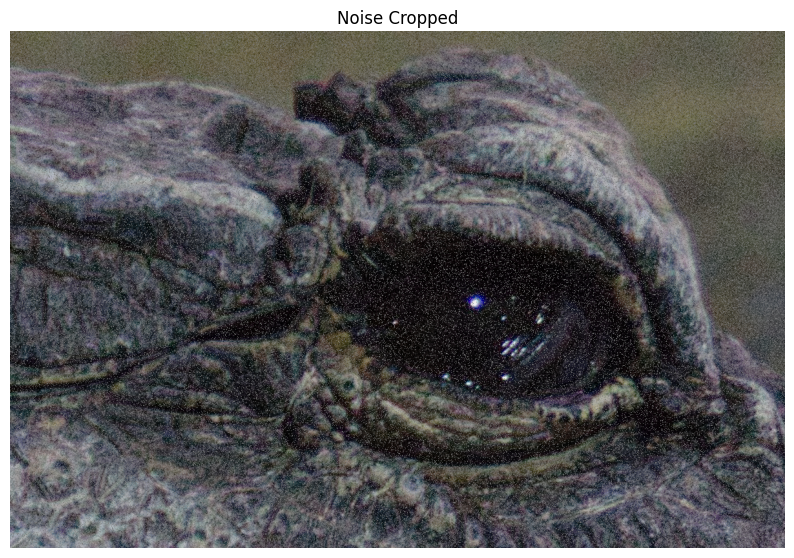

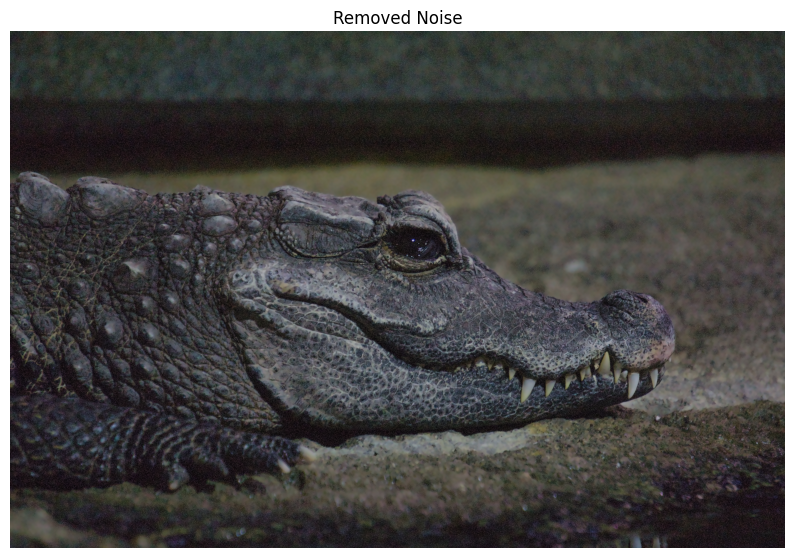

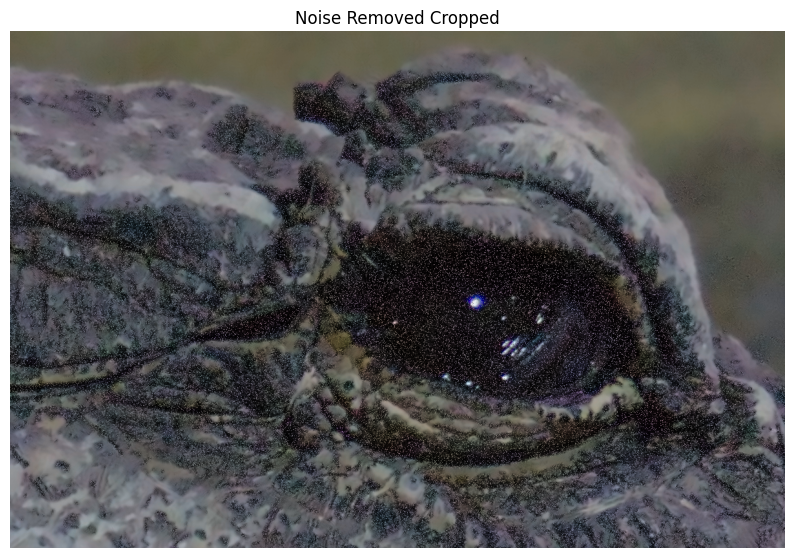

In [53]:
imshow(noise_img, "With Noise", size=15)
imshow(crop(noise_img, 0.4, 0.3, 0.6, 0.5), "Noise Cropped", size=15)

removed_noise_img = cv2.fastNlMeansDenoisingColored(noise_img, None, 11, 6, 7, 21)
imshow(removed_noise_img, "Removed Noise", size=15)
imshow(crop(removed_noise_img, 0.4, 0.3, 0.6, 0.5), "Noise Removed Cropped", size=15)

**There are 4 variations of Non-Local Means Denoising:**

- cv2.fastNlMeansDenoising() - works with a single grayscale images
- cv2.fastNlMeansDenoisingColored() - works with a color image.
- cv2.fastNlMeansDenoisingMulti() - works with image sequence captured in short period of time (grayscale images)
- cv2.fastNlMeansDenoisingColoredMulti() - same as above, but for color images.

---
### Denoising with Histogram

![](https://docs.opencv.org/master/histogram_equalization.png)

This 'adjusts' the dynamic range of an image, making it spread more evenly accorss the intensity distribution, and thus improving contrast.

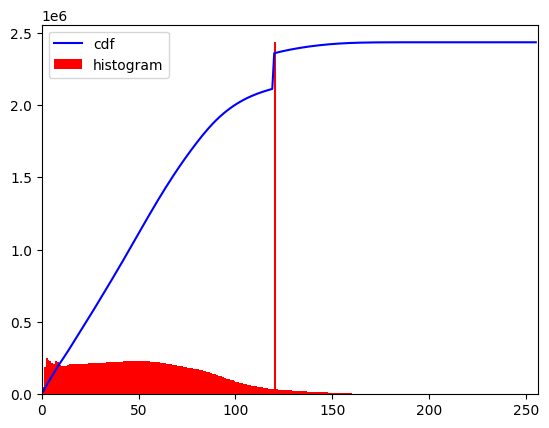

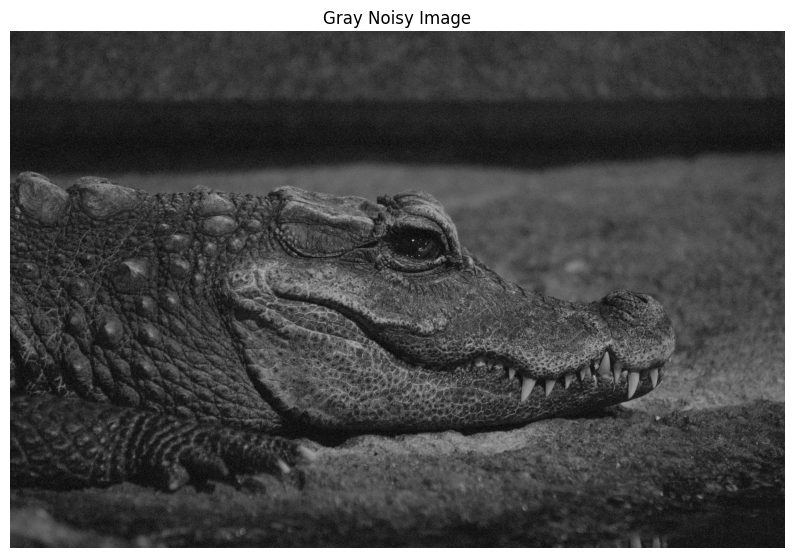

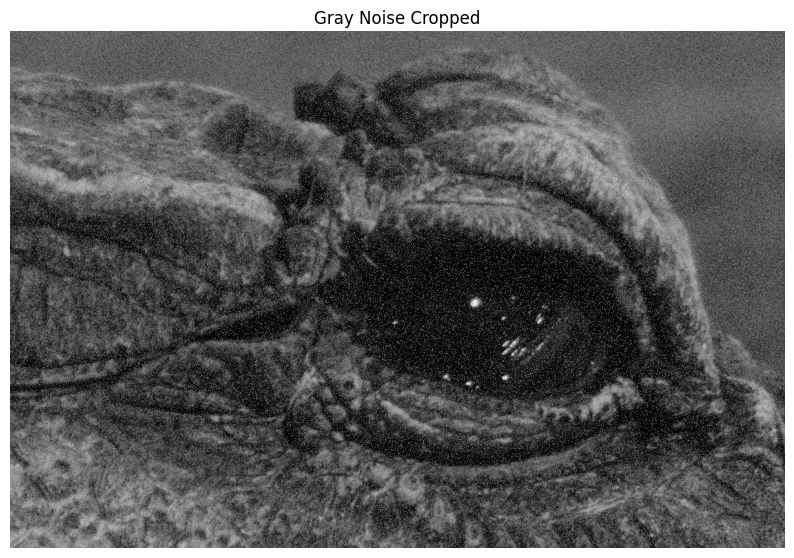

In [58]:
gray_image = cv2.cvtColor(noise_img, cv2.COLOR_BGR2GRAY)

# Create our histogram distribution
hist, bins = np.histogram(gray_image.flatten(),256,[0,256])

# Get the Cumulative Sum 
cdf = hist.cumsum()

# Get a normalize cumulative distribution
cdf_normalized = cdf * float(hist.max()) / cdf.max()

# Plot our CDF overlaid onto our Histogram
plt.plot(cdf_normalized, color='b')
plt.hist(gray_image.flatten(), 256, [0,256], color='r')
plt.xlim([0,256])
plt.legend(('cdf','histogram'), loc='upper left')
plt.show()
imshow(gray_image, "Gray Noisy Image", size=15)
imshow(crop(gray_image, 0.4, 0.3, 0.6, 0.5), "Gray Noise Cropped", size=15)

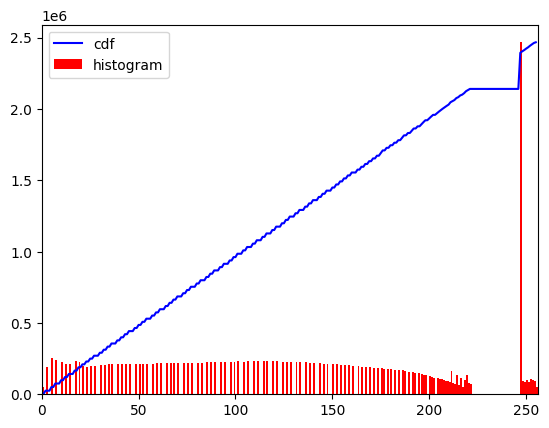

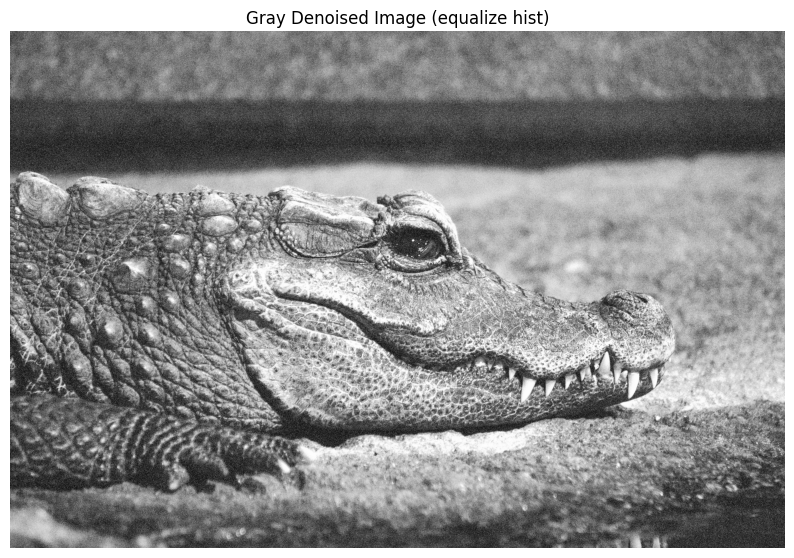

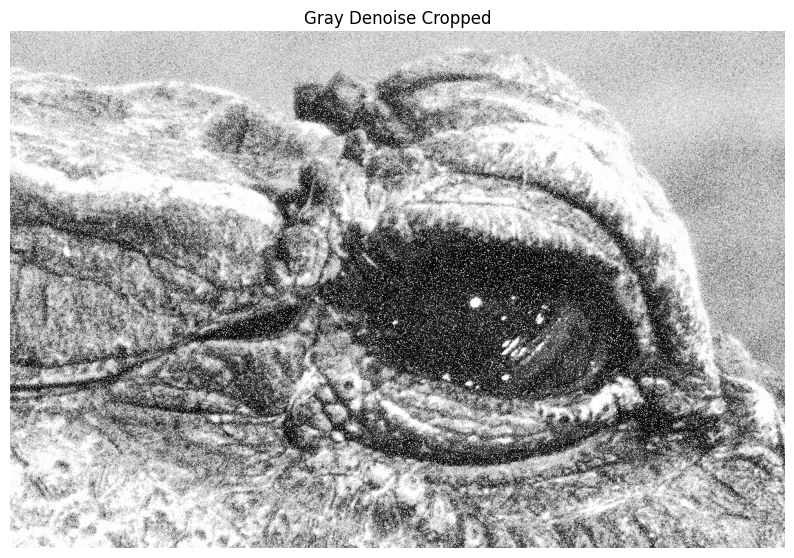

In [59]:
# Equalize our Histogram
gray_image = cv2.equalizeHist(gray_image)

# Create our histogram distribution
hist, bins = np.histogram(gray_image.flatten(), 256, [0,256])

# Get the Cumulative Sum 
cdf = hist.cumsum()

# Get a normalize cumulative distribution
cdf_normalized = cdf * float(hist.max()) / cdf.max()

# Plot our CDF overlaid onto our Histogram
plt.plot(cdf_normalized, color = 'b')
plt.hist(gray_image.flatten(), 256, [0,256], color='r')
plt.xlim([0,256])
plt.legend(('cdf','histogram'), loc='upper left')
plt.show()

imshow(gray_image, "Gray Denoised Image (equalize hist)", size=15)
imshow(crop(gray_image, 0.4, 0.3, 0.6, 0.5), "Gray Denoise Cropped", size=15)

---